<a href="https://colab.research.google.com/github/VictoorV/mri_segmentation/blob/main/brain_mri_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [1]:
pip install torchinfo

In [38]:
import pandas as pd
import kagglehub
import os
import cv2
import re
import matplotlib.pyplot as plt
from matplotlib import animation, rc
import numpy as np
from sklearn.model_selection import train_test_split
import torch
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
import torch.nn as nn
from collections import OrderedDict
from torchinfo import summary
import torch.optim as optim
import time

In [3]:
rc('animation', html='jshtml')
seed = 2025
np.random.seed(seed)
torch.manual_seed(seed)

In [4]:
# Download latest version
path = kagglehub.dataset_download("mateuszbuda/lgg-mri-segmentation")

print("Path to dataset files:", path)

100%|██████████| 714M/714M [00:14<00:00, 51.8MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/mateuszbuda/lgg-mri-segmentation/versions/2


# Data visualization

In [5]:
path = '/root/.cache/kagglehub/datasets/mateuszbuda/lgg-mri-segmentation/versions/2/kaggle_3m'

In [6]:
data = pd.read_csv(os.path.join(path, 'data.csv'))
N, M = data.shape
data

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4941,2.0,4.0,2,2.0,NaN,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,NaN,1.0
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,NaN,0.0
3,TCGA_CS_4944,NaN,5.0,2,1.0,2.0,1.0,1,1.0,1.0,1.0,3.0,6.0,2.0,50.0,3.0,NaN,0.0
4,TCGA_CS_5393,4.0,5.0,2,1.0,2.0,3.0,1,1.0,2.0,1.0,1.0,6.0,2.0,39.0,3.0,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,TCGA_HT_8563,2.0,5.0,3,1.0,NaN,2.0,2,1.0,2.0,1.0,3.0,2.0,1.0,30.0,3.0,2.0,0.0
106,TCGA_HT_A5RC,2.0,4.0,2,2.0,NaN,3.0,2,1.0,2.0,1.0,1.0,2.0,1.0,70.0,3.0,2.0,1.0
107,TCGA_HT_A616,NaN,5.0,2,1.0,NaN,2.0,1,1.0,1.0,1.0,1.0,2.0,1.0,36.0,3.0,2.0,0.0
108,TCGA_HT_A61A,NaN,5.0,2,NaN,NaN,NaN,1,3.0,1.0,1.0,1.0,6.0,1.0,20.0,3.0,2.0,0.0


In [7]:
def get_patient_path(i):
  for dir in os.listdir(path):
    if data.loc[i, 'Patient'] in dir:
      return os.path.join(path, dir)

def get_img_mask_path(img_path):
  img_paths = []
  mask_paths = []
  for file in sorted(os.listdir(img_path), key=lambda s : [int(text) if text.isdigit() else text.lower() for text in re.split(r'(\d+)', s)]):
    if 'mask' not in file:
      img_paths.append(os.path.join(img_path, file))
    if 'mask' in file:
      mask_paths.append(os.path.join(img_path, file))
  return img_paths, mask_paths


In [8]:
def create_animation(i, save=False):
  images, masks = get_img_mask_path(get_patient_path(i))
  fig, ax = plt.subplots()

  def update(frame):
      ax.clear()
      img = cv2.imread(images[frame])
      img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
      ax.imshow(img)

      mask = cv2.imread(masks[frame], cv2.IMREAD_GRAYSCALE)
      mask = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)
      ax.imshow(mask, alpha=0.3)
      ax.set_title(f'Slide {frame+1}/{len(images)}',fontsize=14, color='blue')

  ani = animation.FuncAnimation(fig, update, frames=len(images), interval=500, repeat=True)
  plt.close(fig)
  if save:
    ani.save('animation.gif', writer='pillow')
  return ani

In [9]:
create_animation(0, save=True)

# Data preprocess

In [10]:
patient_paths = []
for i in range(N):
  patient_paths.append(get_patient_path(i))

train_patient_idx, test_patient_idx = train_test_split(range(N), test_size=5, random_state=seed)

train_patient_paths = [patient_paths[i] for i in train_patient_idx]
test_patient_paths = [patient_paths[i] for i in test_patient_idx]

train_image_mask_paths = [get_img_mask_path(patient_path) for patient_path in train_patient_paths]
test_image_mask_paths = [get_img_mask_path(patient_path) for patient_path in test_patient_paths]

train_image_paths, train_mask_paths = zip(*train_image_mask_paths)
test_image_paths, test_mask_paths = zip(*test_image_mask_paths)

train_image_paths = sum(train_image_paths, [])
train_mask_paths = sum(train_mask_paths, [])
test_image_paths = sum(test_image_paths, [])
test_mask_paths = sum(test_mask_paths, [])

In [79]:
IMG_SIZE = 256

transform_train = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.HorizontalFlip(p=0.3),
    A.VerticalFlip(p=0.3),
    A.Rotate(limit=90, p=0.4, border_mode=cv2.BORDER_CONSTANT, value=0.),
    A.RandomBrightnessContrast(p=0.4),
    A.RandomSizedCrop(min_max_height=(75, 200), height=IMG_SIZE, width=IMG_SIZE, p=0.35),
    A.CoarseDropout(p=0.4, min_holes=5, max_holes=20, min_height=10, max_height=20, min_width=10, max_width=20),
    ToTensorV2(),
])

transform_test = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    ToTensorV2(),
])

In [12]:
class CustomDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = cv2.imread(self.image_paths[idx])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) / 255.
        lbl = cv2.imread(self.mask_paths[idx], cv2.IMREAD_GRAYSCALE) / 255.

        if self.transform:
            augmented = self.transform(image = image, mask = lbl)
            image = augmented['image'].to(dtype=torch.float)
            lbl = (augmented['mask'] > 0.5).to(dtype=torch.float)
        return image, lbl

In [62]:
train_dataset = CustomDataset(train_image_paths, train_mask_paths, transform=transform_train)
test_dataset = CustomDataset(test_image_paths, test_mask_paths, transform=transform_test)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Modeling U-Net

In [14]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [15]:
class U_Net(nn.Module): # N*C*H*W
  def __init__(self, in_channels = 3, out_channels = 1):
    super(U_Net, self).__init__()
    self.in_channels = in_channels
    self.out_channels = out_channels

    self.encoder1 = self.convolutional_block(self.in_channels, 64, 0.2, 'encoder1')
    self.max_pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

    self.encoder2 = self.convolutional_block(64, 128, 0.25, 'encoder2')
    self.max_pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

    self.encoder3 = self.convolutional_block(128, 256, 0.3, 'encoder3')
    self.max_pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

    self.encoder4 = self.convolutional_block(256, 512, 0.35, 'encoder4')
    self.max_pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

    self.bottleneck1 = self.convolutional_block(512, 1024, 0.4, 'bottleneck1')

    self.up_conv1 = nn.ConvTranspose2d(in_channels=1024, out_channels=512, kernel_size=2, stride=2, padding=0)
    self.decoder1 = self.convolutional_block(1024, 512, 0.35, 'decoder1')

    self.up_conv2 = nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=2, stride=2, padding=0)
    self.decoder2 = self.convolutional_block(512, 256, 0.3, 'decoder2')

    self.up_conv3 = nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=2, stride=2, padding=0)
    self.decoder3 = self.convolutional_block(256, 128, 0.25, 'decoder3')

    self.up_conv4 = nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=2, stride=2, padding=0)
    self.decoder4 = self.convolutional_block(128, 64, 0.2, 'decoder4')

    self.bottleneck2 = nn.Sequential(OrderedDict([
        ('bottleneck2_conv', nn.Conv2d(in_channels=64, out_channels=self.out_channels, kernel_size=1, padding=0, stride=1, bias=True)),
        ('bottleneck2_softmax', nn.Sigmoid())
    ]))

  def forward(self, x):
    enc1 = self.encoder1(x)
    enc2 = self.encoder2(self.max_pool1(enc1))
    enc3 = self.encoder3(self.max_pool2(enc2))
    enc4 = self.encoder4(self.max_pool3(enc3))

    bottleneck1 = self.bottleneck1(self.max_pool4(enc4))

    dec1 = self.decoder1(torch.cat([enc4, self.up_conv1(bottleneck1)], dim =1))
    dec2 = self.decoder2(torch.cat([enc3, self.up_conv2(dec1)], dim =1))
    dec3 = self.decoder3(torch.cat([enc2, self.up_conv3(dec2)], dim =1))
    dec4 = self.decoder4(torch.cat([enc1, self.up_conv4(dec3)], dim =1))

    output = self.bottleneck2(dec4)
    return output

  @staticmethod
  def convolutional_block(in_channels, out_channels, dropout_prob, name):
    return nn.Sequential(OrderedDict([
        (name + '_conv1', nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, stride=1, bias=True)),
        (name + '_norm1', nn.BatchNorm2d(out_channels)),
        (name + '_relu1', nn.ReLU(inplace=False)),

        (name + '_conv2', nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, stride=1, bias=True)),
        (name + '_norm2', nn.BatchNorm2d(out_channels)),
        (name + '_relu2', nn.ReLU(inplace=False)),
        (name + '_dropout', nn.Dropout2d(p=dropout_prob, inplace=False))
    ]))

In [16]:
model = U_Net()
model.to(device)

U_Net(
  (encoder1): Sequential(
    (encoder1_conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (encoder1_norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (encoder1_relu1): ReLU()
    (encoder1_conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (encoder1_norm2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (encoder1_relu2): ReLU()
    (encoder1_dropout): Dropout2d(p=0.2, inplace=False)
  )
  (max_pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (encoder2): Sequential(
    (encoder2_conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (encoder2_norm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (encoder2_relu1): ReLU()
    (encoder2_conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (encoder2_norm2): BatchNorm2d(128, eps=

In [17]:
summary(model, input_size=(1, 3, IMG_SIZE, IMG_SIZE))

Layer (type:depth-idx)                   Output Shape              Param #
U_Net                                    [1, 1, 256, 256]          --
├─Sequential: 1-1                        [1, 64, 256, 256]         --
│    └─Conv2d: 2-1                       [1, 64, 256, 256]         1,792
│    └─BatchNorm2d: 2-2                  [1, 64, 256, 256]         128
│    └─ReLU: 2-3                         [1, 64, 256, 256]         --
│    └─Conv2d: 2-4                       [1, 64, 256, 256]         36,928
│    └─BatchNorm2d: 2-5                  [1, 64, 256, 256]         128
│    └─ReLU: 2-6                         [1, 64, 256, 256]         --
│    └─Dropout2d: 2-7                    [1, 64, 256, 256]         --
├─MaxPool2d: 1-2                         [1, 64, 128, 128]         --
├─Sequential: 1-3                        [1, 128, 128, 128]        --
│    └─Conv2d: 2-8                       [1, 128, 128, 128]        73,856
│    └─BatchNorm2d: 2-9                  [1, 128, 128, 128]        256
│

In [18]:
def BinaryIoU(preds, targets, threshold=0.5):
  """
  preds : N * 1 * ...
  targets : N * 1 * ...
  """

  preds = (preds > threshold).float()
  preds = preds.squeeze(1)
  targets = targets.squeeze(1)
  intersection = (preds * targets).sum(dim=(1, 2))
  union = (preds + targets).sum(dim=(1, 2)) - intersection
  IoU_batch = intersection / union
  IoU_batch[torch.isnan(IoU_batch)] = 1.
  return IoU_batch.mean().item()

def BinaryDice(preds, targets, threshold=0.5):
  """
  preds : N * 1 * ...
  targets : N * 1 * ...
  """

  preds = (preds > threshold).float()
  preds = preds.squeeze(1)
  targets = targets.squeeze(1)
  intersection = (preds * targets).sum(dim=(1, 2))
  union = (preds + targets).sum(dim=(1, 2)) - intersection
  Dice_batch = 2 * intersection / (preds + targets).sum(dim=(1, 2))
  Dice_batch[torch.isnan(Dice_batch)] = 1.
  return Dice_batch.mean().item()

# Trainig U-Net

In [19]:
def training(model, loader, hist_loss, hist_IoU, hist_Dice):
  model.train()
  running_loss = 0.0
  running_IoU = 0.0
  running_Dice = 0.0

  for images, labels in loader:
    labels = labels.unsqueeze(1)
    images, labels = images.to(device), labels.to(device)

    optimizer.zero_grad()
    outputs = model(images)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()

    running_loss+=loss.item()
    with torch.no_grad():
      running_IoU += BinaryIoU(outputs, labels)
      running_Dice += BinaryDice(outputs, labels)

  running_loss = running_loss/len(loader)
  running_IoU = running_IoU/len(loader)
  running_Dice = running_Dice/len(loader)
  hist_loss.append(running_loss)
  hist_IoU.append(running_IoU)
  hist_Dice.append(running_Dice)

def evaluation(model, loader, hist_loss, hist_IoU, hist_Dice):
  model.eval()
  running_loss = 0.0
  running_IoU = 0.0
  running_Dice = 0.0

  with torch.no_grad():
    for images, labels in loader:
      labels = labels.unsqueeze(1)
      images, labels = images.to(device), labels.to(device)

      outputs = model(images)
      loss = criterion(outputs, labels)

      running_loss+=loss.item()
      running_IoU += BinaryIoU(outputs, labels)
      running_Dice += BinaryDice(outputs, labels)

  running_loss = running_loss/len(loader)
  running_IoU = running_IoU/len(loader)
  running_Dice = running_Dice/len(loader)
  hist_loss.append(running_loss)
  hist_IoU.append(running_IoU)
  hist_Dice.append(running_Dice)

In [20]:
params_to_update = list(model.parameters())

epochs = 15

criterion = nn.BCELoss()
optimizer = optim.AdamW(params_to_update, lr=1e-3, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs, eta_min=1e-5)

training_loss = []
training_IoU = []
training_Dice = []

testing_loss = []
testing_IoU = []
testing_Dice = []

In [21]:
%%time

for epoch in range(epochs):
  current_lr = scheduler.get_last_lr()[0]
  start = time.time()
  training(model, train_loader, training_loss, training_IoU, training_Dice)
  end = time.time()
  elapsed = end-start
  evaluation(model, test_loader, testing_loss, testing_IoU, testing_Dice)
  print(f"Epoch [{epoch+1}/{epochs}]".center(50, "-"))
  print(f"{' ':<20}{'Loss':<15}{'IoU':<15}{'Dice':<15}")
  print(f"{'Training':<20}{training_loss[-1]:<15.3f}{training_IoU[-1]:<15.3f}{training_Dice[-1]:<15.3f}")
  print(f"{'Testing':<20}{testing_loss[-1]:<15.3f}{testing_IoU[-1]:<15.3f}{testing_Dice[-1]:<15.3f}")
  print(f"{'Learning Rate':<20}{current_lr:.5f}")
  print(f"{'-' * 50}")
  scheduler.step()

  model_name =  str(epoch+1) + "_" + model.__class__.__name__+ "_" + ".pth"
  torch.save(model.state_dict(), model_name)
  print(f"Training took {elapsed:.1f} seconds. Model {model_name} saved")
  print("")


-------------------Epoch [1/15]-------------------
                    Loss           IoU            Dice           
Training            0.170          0.578          0.590          
Testing             0.059          0.687          0.691          
Learning Rate       0.00100
--------------------------------------------------
Training took 205.7 seconds. Model 1_U_Net_.pth saved

-------------------Epoch [2/15]-------------------
                    Loss           IoU            Dice           
Training            0.065          0.635          0.648          
Testing             0.036          0.696          0.698          
Learning Rate       0.00099
--------------------------------------------------
Training took 209.9 seconds. Model 2_U_Net_.pth saved

-------------------Epoch [3/15]-------------------
                    Loss           IoU            Dice           
Training            0.050          0.659          0.670          
Testing             0.028          0.697          0

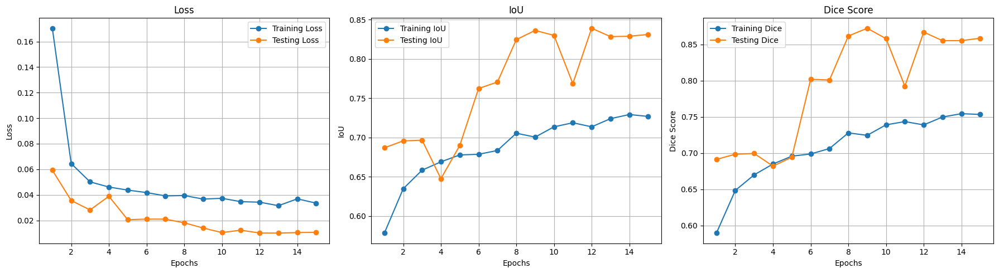

In [22]:
epochs = range(1, len(training_loss) + 1)

fig, ax = plt.subplots(1, 3, figsize=(18, 5))

ax[0].plot(epochs, training_loss, label="Training Loss", marker='o')
ax[0].plot(epochs, testing_loss, label="Testing Loss", marker='o')
ax[0].set_title("Loss")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")
ax[0].grid()
ax[0].legend()

ax[1].plot(epochs, training_IoU, label="Training IoU", marker='o')
ax[1].plot(epochs, testing_IoU, label="Testing IoU", marker='o')
ax[1].set_title("IoU")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("IoU")
ax[1].grid()
ax[1].legend()

ax[2].plot(epochs, training_Dice, label="Training Dice", marker='o')
ax[2].plot(epochs, testing_Dice, label="Testing Dice", marker='o')
ax[2].set_title("Dice Score")
ax[2].set_xlabel("Epochs")
ax[2].set_ylabel("Dice Score")
ax[2].grid()
ax[2].legend()

plt.tight_layout()
plt.show()

In [23]:
model = U_Net()
model.load_state_dict(torch.load("12_U_Net_.pth", weights_only=True))
model = model.to(device)

# Testing

In [116]:
[int(len(os.listdir(dir))/2) for dir in test_patient_paths]

[60, 20, 56, 37, 40]

In [ ]:
# TCGA_DU_7014 [0:60]
# TCGA_CS_4943 [60:80]
# TCGA_DU_A5TT [80:136]
# TCGA_DU_8163 [136:173]
# TCGA_DU_7309 [173:213]

In [117]:
model.eval()
test_images = []
predictions = []
ground_truths = []
frames_IoU = []
frames_Dice = []

with torch.no_grad():
    for images, labels in test_loader:
        labels = labels.unsqueeze(1)
        images, labels = images.to(device), labels.to(device)

        outputs = model(images)


        for i in range(images.size(0)):
            pred = outputs[i:i+1]
            target = labels[i:i+1]
            img = np.transpose(images[i:i+1].squeeze().cpu().numpy(), (1, 2, 0))

            frames_IoU.append(BinaryIoU(pred, target))
            frames_Dice.append(BinaryDice(pred, target))
            test_images.append(img)
            predictions.append((pred > 0.5).float().squeeze().cpu().numpy())
            ground_truths.append(target.squeeze().cpu().numpy())

In [118]:
TCGA_DU_7014_IoU = np.mean(frames_IoU[0:60])
TCGA_CS_4943_IoU = np.mean(frames_IoU[60:80])
TCGA_DU_A5TT_IoU = np.mean(frames_IoU[80:136])
TCGA_DU_8163_IoU = np.mean(frames_IoU[136:173])
TCGA_DU_7309_IoU = np.mean(frames_IoU[173:213])

TCGA_DU_7014_Dice = np.mean(frames_Dice[0:60])
TCGA_CS_4943_Dice = np.mean(frames_Dice[60:80])
TCGA_DU_A5TT_Dice = np.mean(frames_Dice[80:136])
TCGA_DU_8163_Dice = np.mean(frames_Dice[136:173])
TCGA_DU_7309_Dice = np.mean(frames_Dice[173:213])

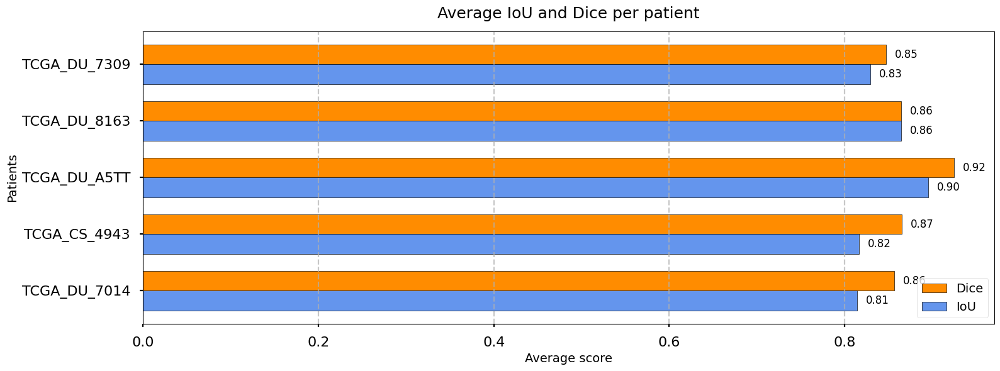

In [119]:
patients = [
    "TCGA_DU_7014",
    "TCGA_CS_4943",
    "TCGA_DU_A5TT",
    "TCGA_DU_8163",
    "TCGA_DU_7309",
]

iou_values = [
    TCGA_DU_7014_IoU,
    TCGA_CS_4943_IoU,
    TCGA_DU_A5TT_IoU,
    TCGA_DU_8163_IoU,
    TCGA_DU_7309_IoU,
]

dice_values = [
    TCGA_DU_7014_Dice,
    TCGA_CS_4943_Dice,
    TCGA_DU_A5TT_Dice,
    TCGA_DU_8163_Dice,
    TCGA_DU_7309_Dice,
]

plt.style.use("seaborn-v0_8-poster")
fig, ax = plt.subplots(figsize=(16, 6))

bar_width = 0.35
index = np.arange(len(patients))

bars_dice = ax.barh(index + bar_width, dice_values, bar_width, color="darkorange", edgecolor="black", label="Dice")
bars_iou = ax.barh(index, iou_values, bar_width, color="cornflowerblue", edgecolor="black", label="IoU")

for bar in bars_iou:
    ax.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height() / 2,
            f"{bar.get_width():.2f}", va="center", fontsize=12, color="black")

for bar in bars_dice:
    ax.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height() / 2,
            f"{bar.get_width():.2f}", va="center", fontsize=12, color="black")

ax.set_title("Average IoU and Dice per patient", fontsize=18, pad=15)
ax.set_xlabel("Average score", fontsize=14)
ax.set_ylabel("Patients", fontsize=14)
ax.legend(loc='lower right', fontsize=14)
ax.set_yticks(index + bar_width / 2)
ax.set_yticklabels(patients)
ax.grid(axis="x", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

In [28]:
selected_patients = [
    "TCGA_CS_4943",
    "TCGA_DU_8163",
    "TCGA_DU_7309",
]

In [160]:
def create_animation2(i, save=False):
    if i == 0:
        imgs = test_images[0:60]
        prds = predictions[0:60]
        trths = ground_truths[0:60]
    if i == 1:
        imgs = test_images[60:80]
        prds = predictions[60:80]
        trths = ground_truths[60:80]
    if i == 2:
        imgs = test_images[80:136]
        prds = predictions[80:136]
        trths = ground_truths[80:136]
    if i == 3:
        imgs = test_images[136:173]
        prds = predictions[136:173]
        trths = ground_truths[136:173]
    if i == 4:
        imgs = test_images[173:213]
        prds = predictions[173:213]
        trths = ground_truths[173:213]

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    text_obj = fig.text(0.95, 0.05, '', ha='right', va='bottom', fontsize=12, color='black', weight='bold', backgroundcolor='white')

    def update(frame):
        for a in ax:
            a.clear()

        img = imgs[frame]
        ax[0].imshow(img)
        ax[1].imshow(img)

        trth = trths[frame]
        ax[0].imshow(trth, cmap='gray', alpha=0.15)
        ax[0].set_title('Ground Truth', fontsize=14, color='green')

        prd = prds[frame]
        ax[1].imshow(prd, cmap='gray', alpha=0.15)
        ax[1].set_title('Prediction', fontsize=14, color='red')

        for a in ax:
            a.axis('off')

        text_obj.set_text(f'Frame {frame+1}/{len(imgs)}')

    ani = animation.FuncAnimation(fig, update, frames=len(imgs), interval=500, repeat=True)
    plt.close(fig)

    if save:
        ani.save('animation.gif', writer='pillow')

    return ani

In [159]:
create_animation2(1, True)